In [1]:
import warnings
warnings.filterwarnings('ignore') 

from matplotlib import pyplot as plt 
plt.style.use("../mpl_style/matplotlib.rc")
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel, Matern
import os 
os.chdir("/Users/satya/Documents/sklearn-bax/")
from src.acquisition import multiproperty_infobax
import numpy as np

from copy import deepcopy



In [2]:
def fn(x, noise = False, noise_threshold = 0.001):
    y =  (1/15) * (-(x-1)*(x/2-2)*(x/2+1)*(x+2))
    return y

x = np.expand_dims(np.linspace(-3, 4, 100), axis = -1)
y = fn(x)

# handles one-property measurements
if len(y.shape) == 1:
    y = y.reshape(-1, 1)

In [3]:
from abc import ABC, abstractmethod

class SubspaceAlgorithm(ABC):
    @abstractmethod
    def identify_subspace(x, y):
        pass
    
class BottomTopPercentile(SubspaceAlgorithm):
    
    def __init__(self, percentile_threshold):
        self.percentile_threshold = percentile_threshold
        
    def identify_subspace(self, x, y):
        percentile_threshold = self.percentile_threshold
        y_90 = np.percentile(y, percentile_threshold)
        y_10 = np.percentile(y, 100 - percentile_threshold)
        ids1 = np.where(y >= y_90)[0]
        ids2 = np.where(y <= y_10)[0]
        
        return list(set(ids1).union(set(ids2)))
    
class LevelBand(SubspaceAlgorithm):
    
    def __init__(self, threshold_list):
        self.threshold_list = threshold_list

    def identify_subspace(self, y_vals, x_vals):
        y_vals = np.array(y_vals)
        ids1 = list(set(np.where(y_vals >= self.threshold_list[0])[0]))
        ids2 = list(set(np.where(y_vals <= self.threshold_list[1])[0]))
        return list(set(ids1).intersection(set(ids2)))
    
class DoubleLevelBand(SubspaceAlgorithm):
    
    def __init__(self, threshold_lists):
        self.threshold_lists = threshold_lists

    def identify_subspace(self, y_vals, x_vals):
        y_vals = np.array(y_vals)
        ids1 = list(set(np.where(y_vals >= self.threshold_lists[0][0])[0]))
        ids2 = list(set(np.where(y_vals <= self.threshold_lists[0][1])[0]))
        
        
        ids3 = list(set(np.where(y_vals >= self.threshold_lists[1][0])[0]))
        ids4 = list(set(np.where(y_vals <= self.threshold_lists[1][1])[0]))
        
        return list(set(ids1).intersection(set(ids2)).union(set(ids3).intersection(set(ids4))))
    
class XDependentLevelBand(SubspaceAlgorithm):
    
    def __init__(self, threshold_lists, x_condition):
        self.threshold_lists = threshold_lists
        self.x_condition = x_condition
        
    def identify_subspace(self, y_vals, x_vals):
        y_vals = np.array(y_vals)
        
        idsCondition = set(np.where(x_vals > self.x_condition)[0])
        ids1 = list(set(np.where(y_vals >= self.threshold_lists[0][0])[0]))
        ids2 = list(set(np.where(y_vals <= self.threshold_lists[0][1])[0]))
        
        intersection1 = set(ids1).intersection(set(ids2)).intersection(idsCondition)
                               
        idsNotCondition = set(np.where(x_vals < self.x_condition)[0])
        ids3 = list(set(np.where(y_vals >= self.threshold_lists[1][0])[0]))
        ids4 = list(set(np.where(y_vals <= self.threshold_lists[1][1])[0]))
        
        intersection2 = set(ids3).intersection(set(ids4)).intersection(idsNotCondition)
                         
                         
        return list(intersection1.union(intersection2))


In [4]:
# algo = LevelBand(threshold_list = [0.5, 0.70])
# algo = DoubleLevelBand(threshold_lists = [[-0.5, -0.25], [0.7,  1.0]])
# algo = XDependentLevelBand(threshold_lists = [[0.6,  1.0],[-0.5, -0.25]], x_condition = 3)
algo = BottomTopPercentile(percentile_threshold = 90)

In [5]:
np.random.seed(10)




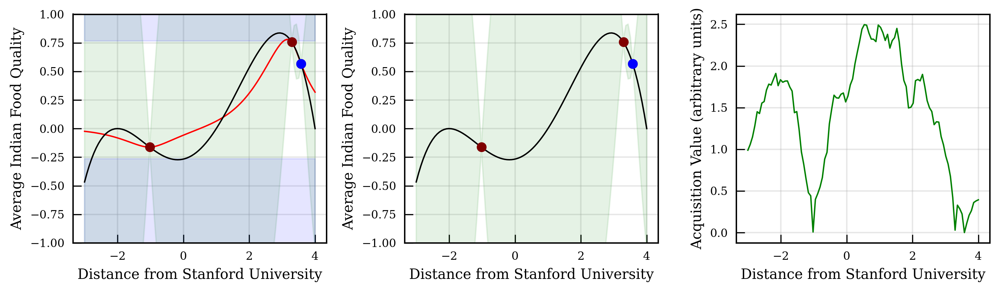

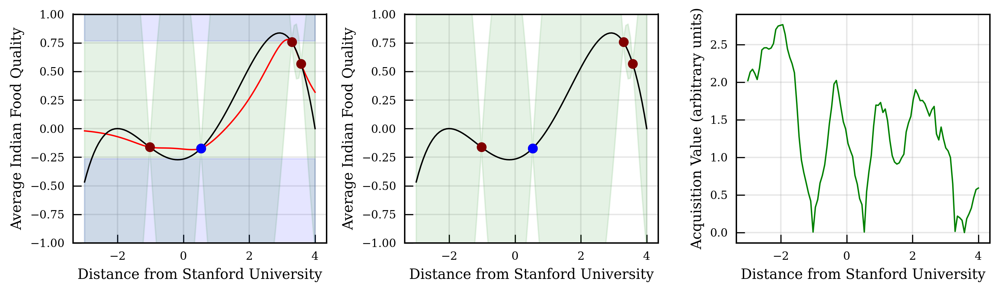

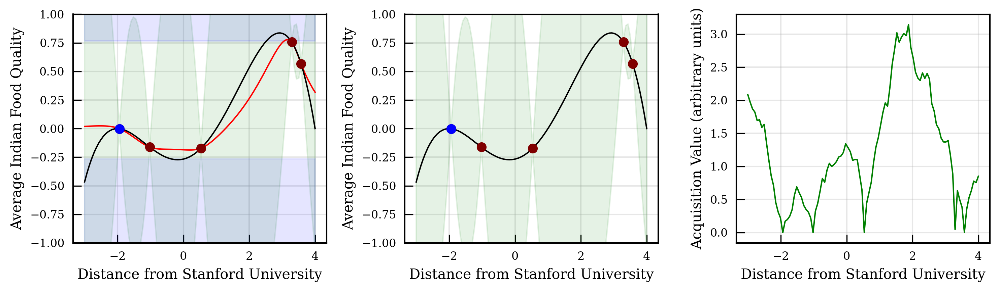

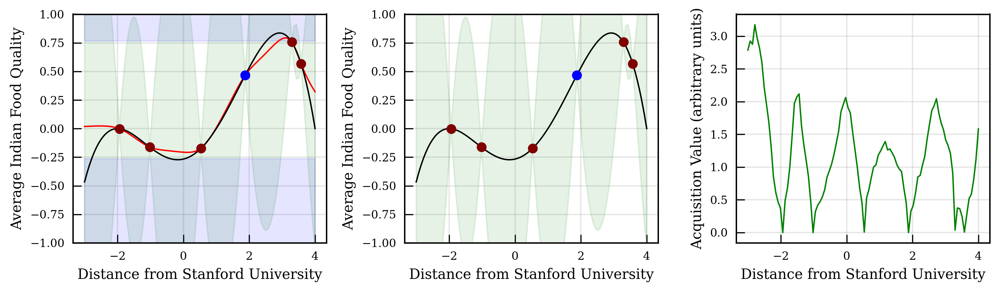

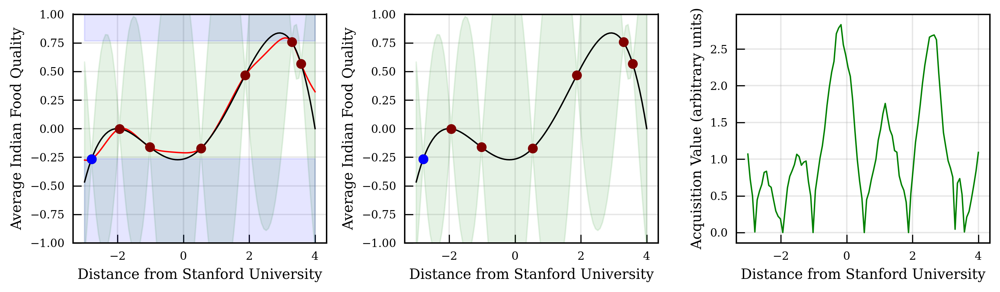

...

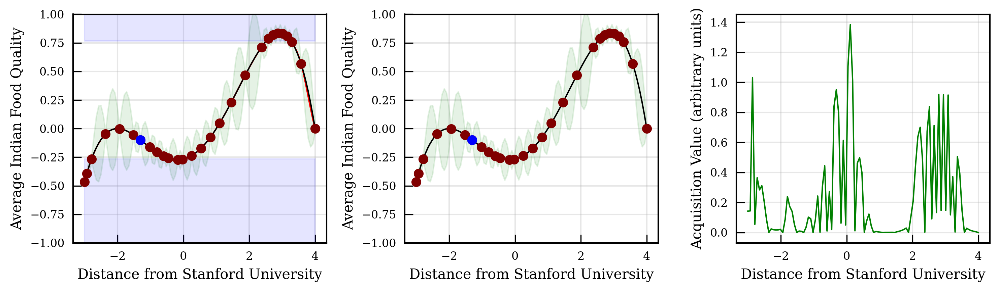

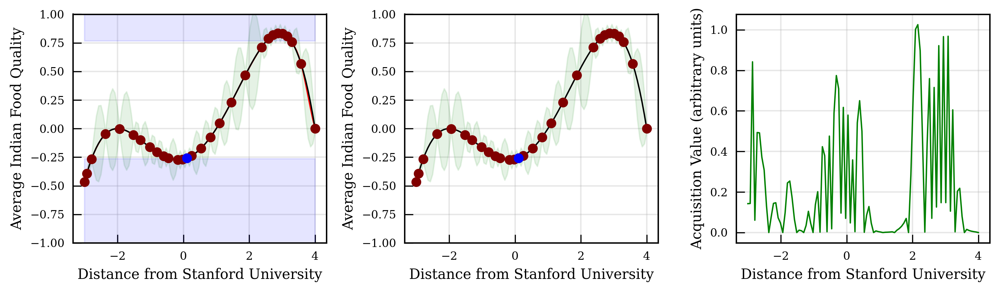

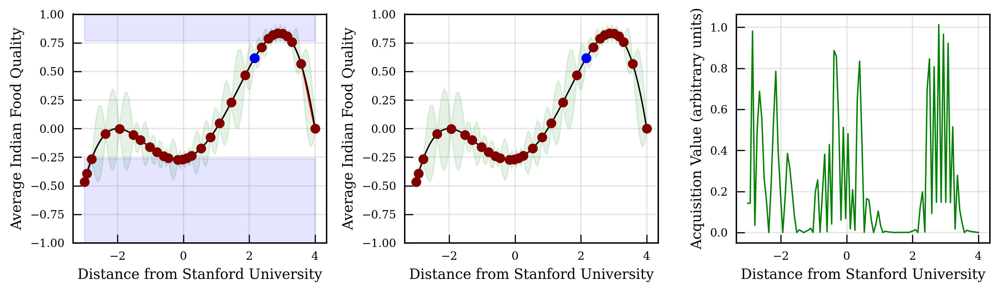

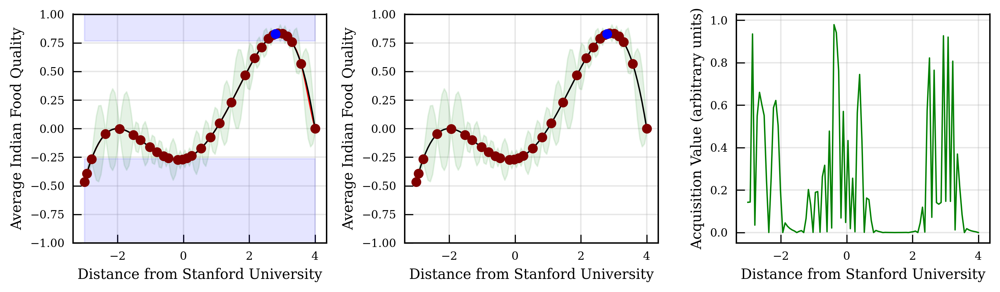

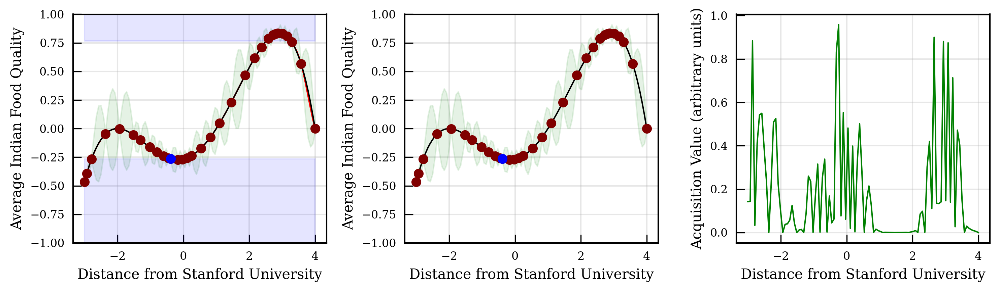

In [7]:
kernel = ConstantKernel(2.0, constant_value_bounds='fixed') * Matern(length_scale=1.0, length_scale_bounds='fixed') + WhiteKernel(0.0001, noise_level_bounds= 'fixed')
prevent_requery = False 

all_ids = list(np.arange(0, len(fn(x))))
true_target_ids = algo.identify_subspace(x, y)
true_not_target_ids = list(set(all_ids) - set(true_target_ids))

train_indices = list(np.random.choice(all_ids, 3))
x_train = x[train_indices]
y_train = y[train_indices]

collected_ids = list(train_indices)

for i in range(30):
    
    model = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer = 10)
    acquisition_function, gpr, _, _ = multiproperty_infobax(x_domain = x, x_train = x_train, y_train = y_train, model = model, algorithm = algo, n_posterior_samples = 20)

    posterior_mean, posterior_std = gpr.predict(x, return_std= True)
        
    if prevent_requery:
        acquisition_function[collected_ids] = -np.inf
        
    fig, axes = plt.subplots(1, 3, figsize=(10, 3), dpi = 300)
    axes[0].scatter(x_train, y_train, color='maroon', zorder=10)
    axes[0].scatter(x_train[-1], y_train[-1], color='blue', zorder=10)
    axes[0].fill_between(np.squeeze(x), posterior_mean - 2 * posterior_std, posterior_mean + 2 * posterior_std, color='green', alpha=0.1)
    axes[0].plot(x, posterior_mean, color='red')
    axes[0].plot(x, fn(x), color='black')
    axes[0].set_ylabel('Average Indian Food Quality')
    axes[0].set_xlabel('Distance from Stanford University')
    axes[0].set_ylim(-1, 1)
    axes[0].fill_between(np.squeeze(x), np.percentile(fn(x), 90), 1.0, color='blue', alpha=0.1, label='Fill Area')
    axes[0].fill_between(np.squeeze(x), -1.0, np.percentile(fn(x), 10), color='blue', alpha=0.1, label='Fill Area')

    # for i in range(5):
    #     axes[1].plot(x, posterior_samples[:, i], linewidth=0.5)
        
    axes[1].scatter(x_train, y_train, color='maroon', zorder=10)
    axes[1].scatter(x_train[-1], y_train[-1],color='blue', zorder=10)
    axes[1].set_ylabel('Posterior Sample')
    axes[1].plot(x, fn(x), color='black')
    axes[1].set_ylim(-1, 1)
    axes[1].fill_between(np.squeeze(x), posterior_mean - 2 * posterior_std, posterior_mean + 2 * posterior_std, color='green', alpha=0.1)
    axes[1].set_ylabel('Average Indian Food Quality')
    axes[1].set_xlabel('Distance from Stanford University')

    axes[2].plot(x, acquisition_function, color='green')
    axes[2].set_ylabel('Acquisition Value (arbitrary units)')
    axes[2].set_xlabel('Distance from Stanford University')
    
    plt.tight_layout()
    plt.show()
    
    next_id = np.argmax(acquisition_function)
    collected_ids.append(next_id)
    
    x_next = x[next_id]
    y_next = y[next_id]

    x_train = np.vstack((x_train, x_next))
    y_train = np.vstack((y_train, y_next))